## ***4. EDA - Exploratory Data Analysis***

####  Type Feature

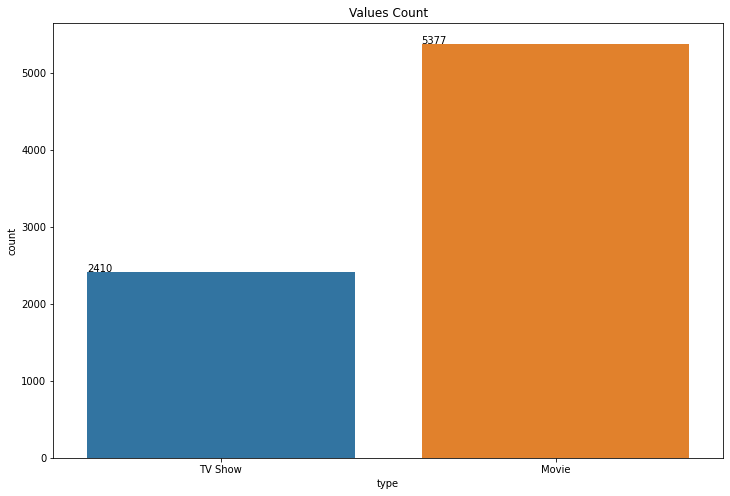

In [ ]:
# Coutplot visualization code
g = sns.countplot(x=df['type'])
g.set_title('Values Count')
# adding value count on the top of bar
for p in g.patches:  #adding value count on the top of bar
   g.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))
plt.show()

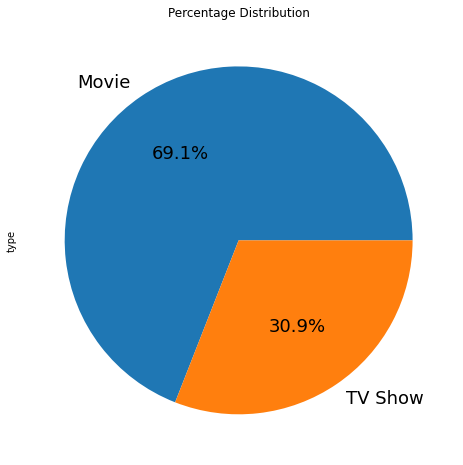

In [ ]:
# piechart
df['type'].value_counts().plot.pie(fontsize= 18,autopct="%.1f%%",figsize=(10,8),textprops={'fontsize': 15})
plt.title('Percentage Distribution')
plt.show()

Obesrvation:


*   Netflix has 5377 movies and 2410 TV shows, there are more number movies on Netflix than TV shows.
*   69.1% are Movies and 30.9% are TV shows in NetFlix dataset.






#### Title Feature

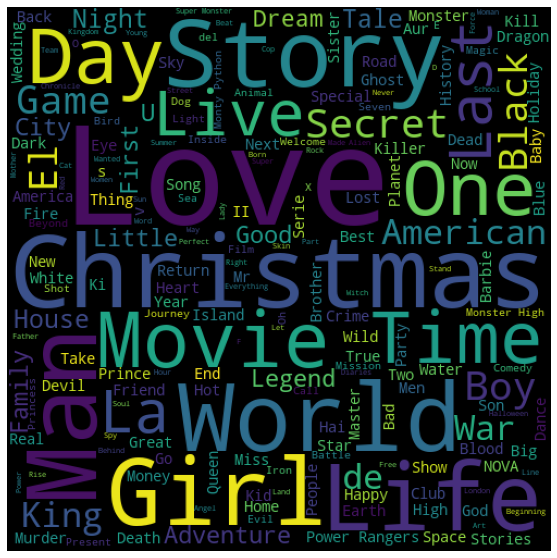

In [ ]:
# text document visualization code
text = " ".join(word for word in df['title'])

# create the word cloud
wordcloud = WordCloud(stopwords=STOPWORDS).generate(text)

# plot the word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud)
    plt.axis("off");
wordcloud = WordCloud(width = 500, height = 500, background_color='black', random_state=10).generate(text)
plot_cloud(wordcloud)

Obesrvation:
Word like Christmas, Love, World, Man, Story are very common word which appear most of the time in title column.

#### Chart - 3 Director Feature

In [ ]:
df['director'].value_counts().head()

Raúl Campos, Jan Suter    18
Marcus Raboy              16
Jay Karas                 14
Cathy Garcia-Molina       13
Youssef Chahine           12
Name: director, dtype: int64

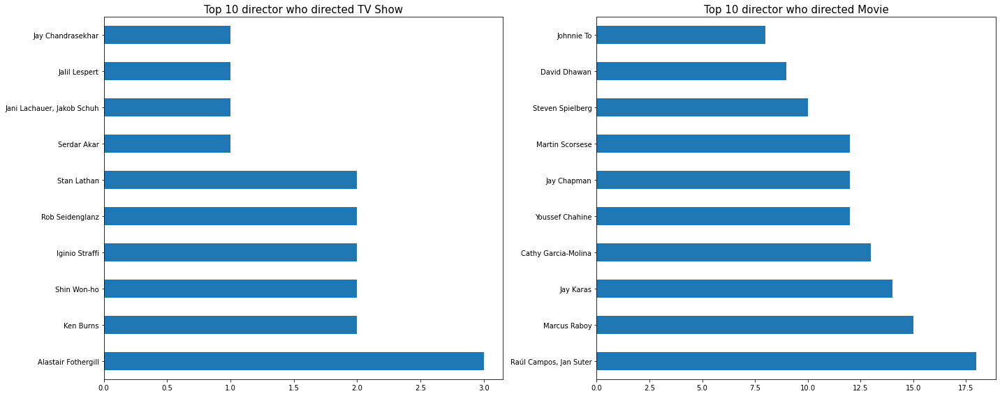

In [ ]:
# Bar plot visualization code
fig,ax = plt.subplots(1,2, figsize=(20,8))

# top 10 director who directed TV show
show = df[df['type']=='TV Show']['director'].value_counts().head(10).plot(kind='barh', ax=ax[0])
show.set_title('Top 10 director who directed TV Show', size=15)

# top 10 director who directed movie
movie = df[df['type']=='Movie']['director'].value_counts().head(10).plot(kind='barh', ax=ax[1])
movie.set_title('Top 10 director who directed Movie', size=15)
plt.tight_layout()
plt.show()

Observation:

Alstair Fothergill directed highest number of Tv shows in the dataset which is 3.

Raul Campos and Jan Suter together have directed 18 movies, higher than anyone in the dataset.

#### Cast Feature

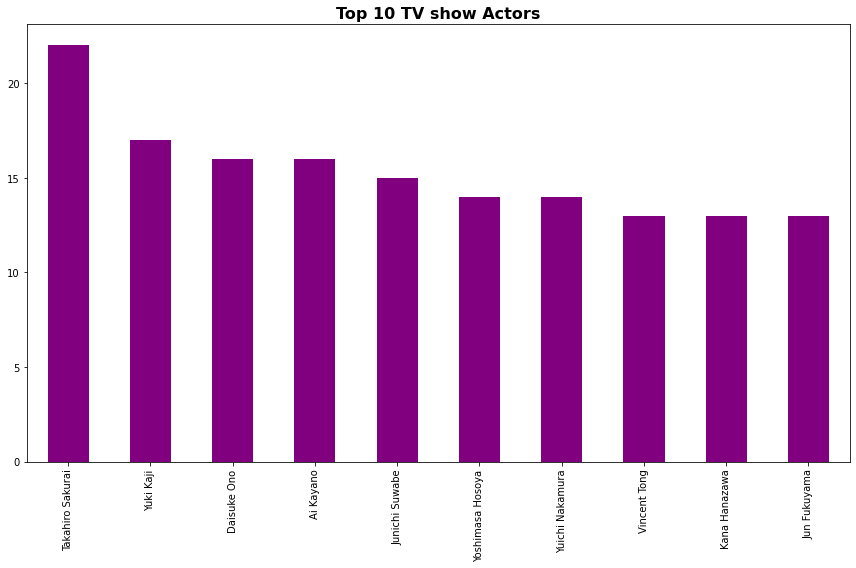

In [ ]:
# Creating TV shows actor from cast column
top_10_TVshows_actor = df[df['type']=='TV Show']['cast'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
# plotting actor who appered highest number of TV Show
g = top_10_TVshows_actor.value_counts().head(10).plot(kind='bar',color='purple')
g.set_title('Top 10 TV show Actors',size='16',fontweight="bold")
plt.tight_layout()
plt.show()

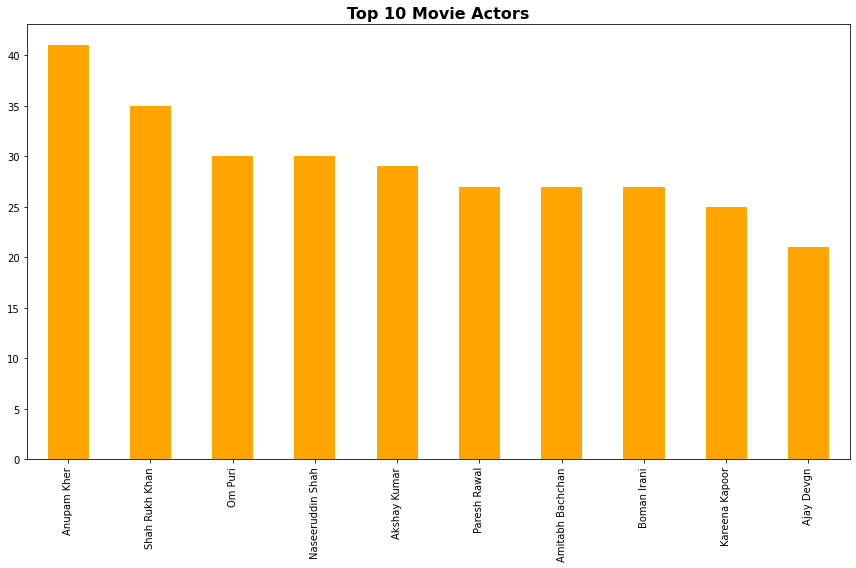

In [ ]:
# Creating Movie actor from cast column
top_10_Movie_actor = df[df['type']=='Movie']['cast'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
# plotting actor who appered highest number of Movie
B = top_10_Movie_actor.value_counts().head(10).plot(kind='bar',color='orange')
B.set_title('Top 10 Movie Actors',size='16',fontweight="bold")
plt.tight_layout()
plt.show()

Observation :

*   Anupam Kher, Shahrukh Khan, Om Puri play highest number of role in the movies.
*   Takahiro Sakurai, Yuki Kaji, Daisuke Ono play highest  number of roles in the TV shows.





#### Country Feature

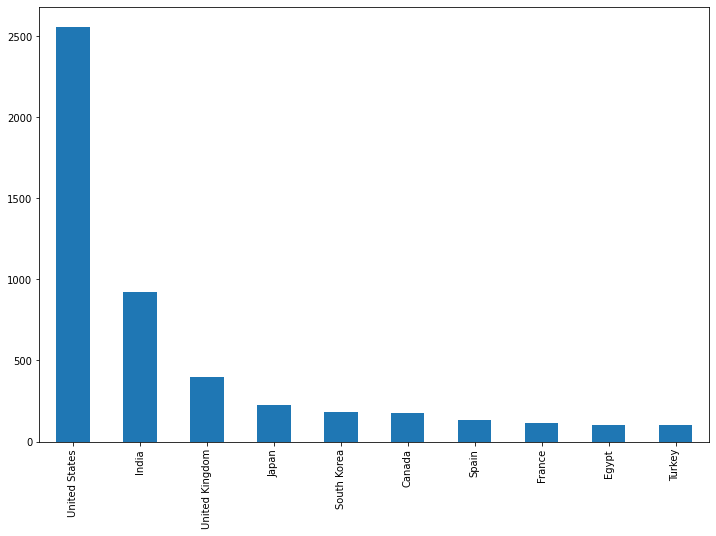

In [ ]:
# bar plot visualization code
# Top 10 Countries
df['country'].value_counts().head(10).plot(kind='bar')
plt.show()

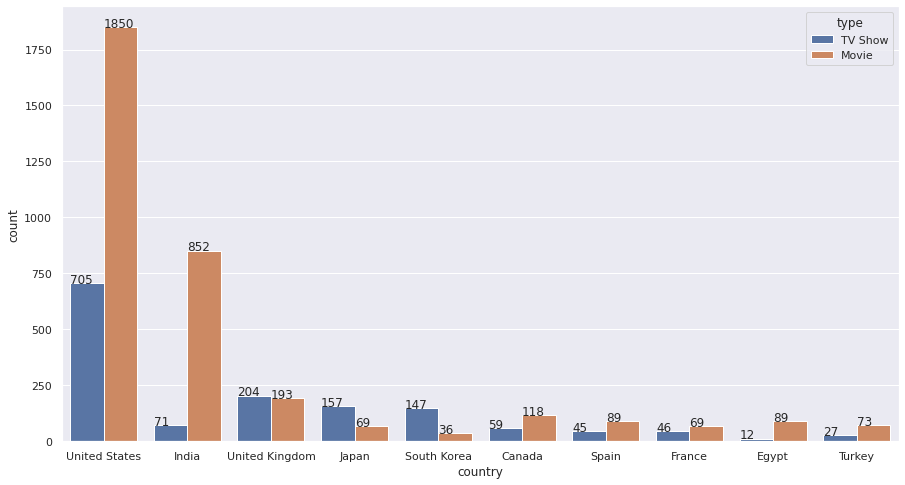

In [ ]:
# Top 10 country with the highest number of TV shows and Movies
sns.set(rc = {'figure.figsize':(15,8)})
graph = sns.countplot(x="country", data=df, hue='type', order=df['country'].value_counts().index[0:10])
for p in graph.patches:  #adding value count on the top of bar
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))
plt.show()

Observation :

The highest number of Movies/TV shows were based out of the US, followed by India and UK.

#### Release_Year Feature

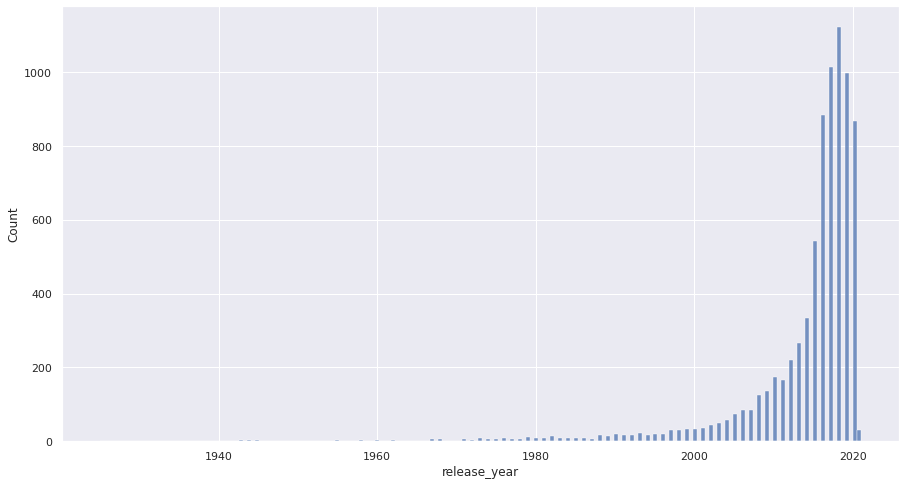

In [ ]:
# Histogram visualization code for realease year
sns.histplot(df['release_year'])
plt.show()

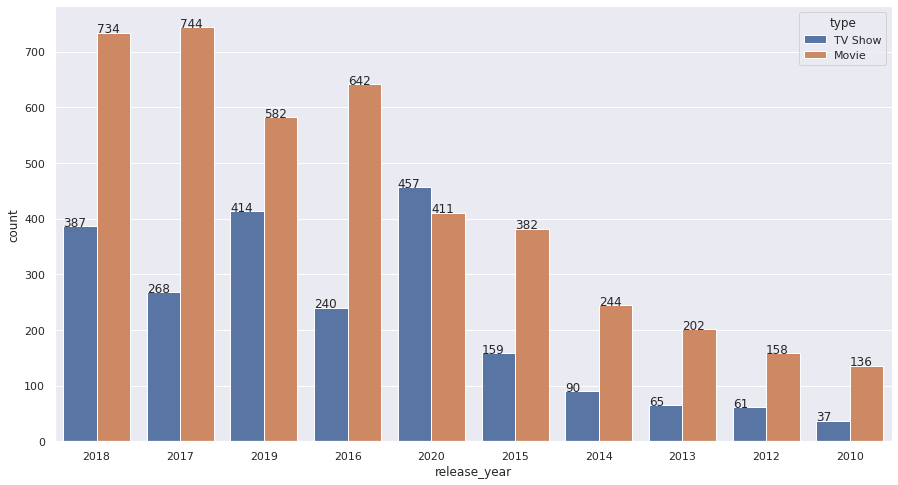

In [ ]:
# Most Released Movies and TV shows
graph = sns.countplot(x="release_year", data=df, hue='type', order=df['release_year'].value_counts().index[0:10])
for p in graph.patches:  #adding value count on the top of bar
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))
plt.show()

Observation:

*   Highest number of movie/shows are released in between 2015-2020 on NetFlix.
*   Highest number Movies are 744 in year 2017 and higest number of TV Shows are 457 in year 2020.

#### Rating Feature

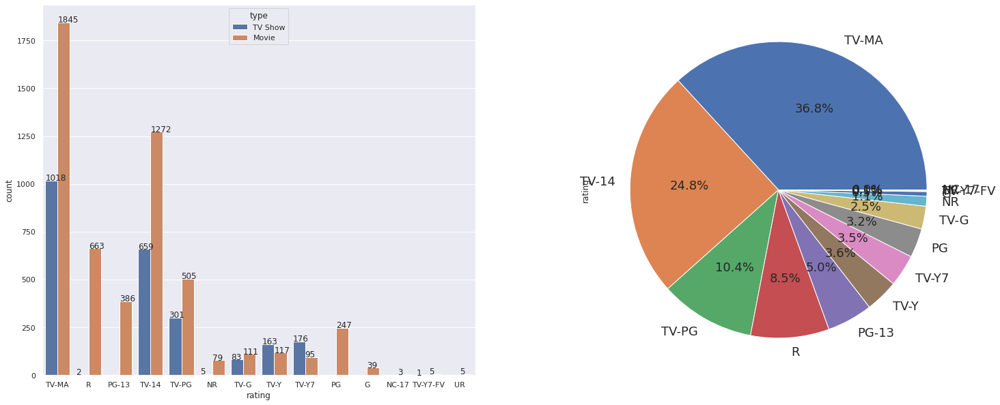

In [ ]:
# Bivariate analysis visualization code
fig,ax = plt.subplots(1,2, figsize=(25,15))
graph = sns.countplot(x = df['rating'],data=df,hue=df['type'],ax=ax[0])
plt.xticks(rotation=90)
for p in graph.patches:  #adding value count on the top of bar
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

percent = df['rating'].value_counts()
percent.plot.pie(fontsize= 18,autopct="%.1f%%",figsize=(25,10),textprops={'fontsize': 15}, ax=ax[1])
plt.show()

Observation:

*   Most of the Movie and TV Shows have rating of TV-MA (i.e mature audiences) followed by TV-14.
*   For both the cases TV-MA has the highest number of ratings(i.e mature audiences).



#### Duration Feature

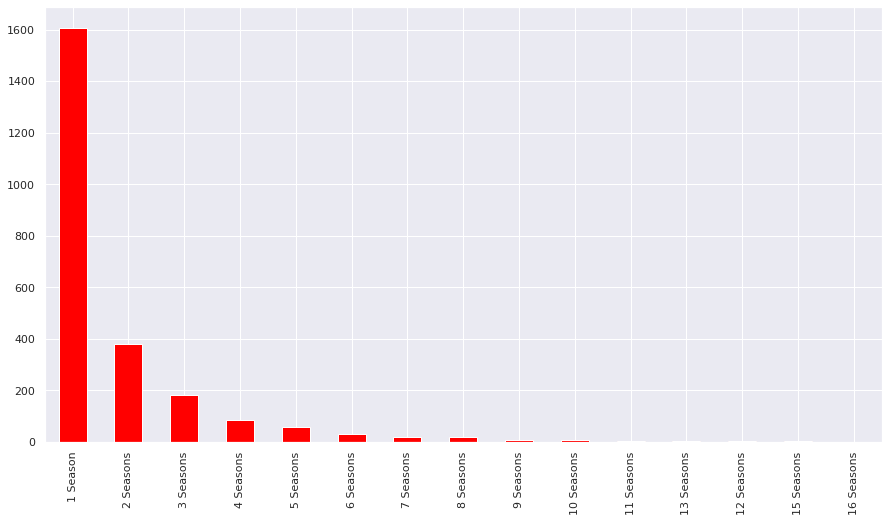

In [ ]:
# Bar plot visualization code
# Duration of TV shows
df[df['type']=='TV Show']['duration'].value_counts().plot(kind='bar',color="red")
plt.show()

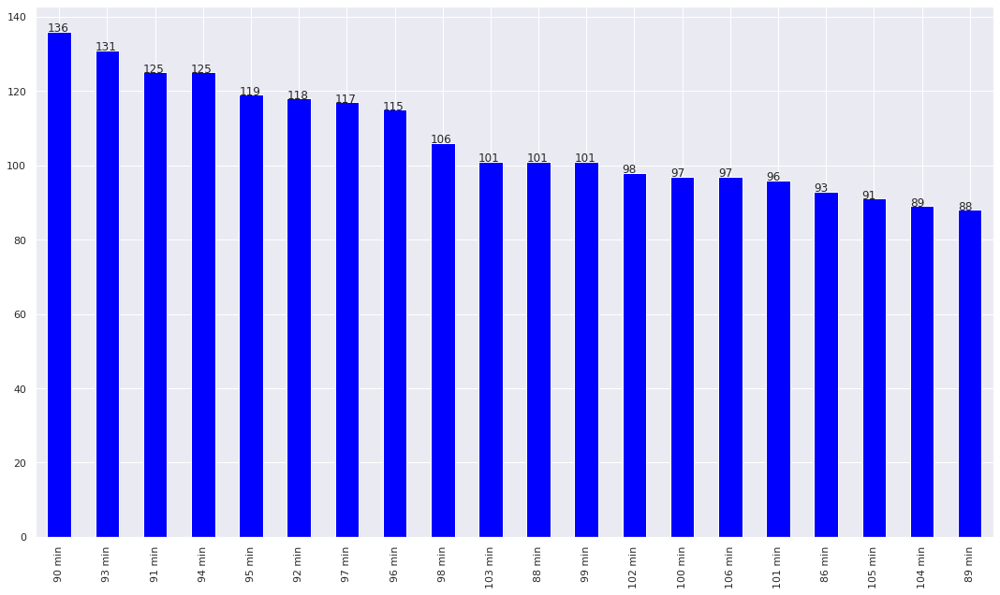

In [ ]:
# Bar plot Duration of Movies
Movies_duration = df[df['type']=='Movie']['duration'].value_counts().head(20).plot(kind='bar',color = 'blue')
for p in Movies_duration.patches:  #adding value count on the top of bar
   Movies_duration.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))
plt.tight_layout()
plt.show()

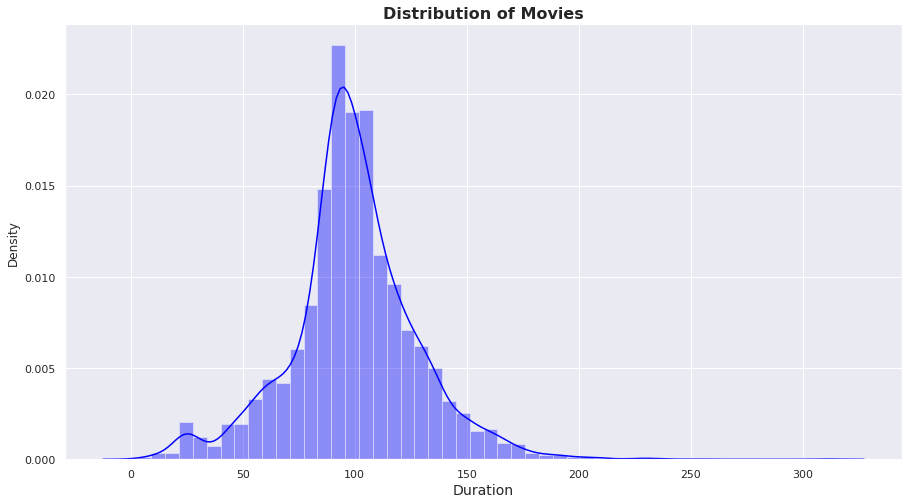

In [ ]:
#Checking the distribution of Movie Durations
plt.figure(figsize=(15,8))
#Regular Expression pattern \d is a regex pattern for digit + is a regex pattern for at leas
sns.distplot(Movies['duration'].str.extract('(\d+)'),color='Blue')
plt.title('Distribution of Movies',fontsize=16,fontweight="bold")
plt.xlabel('Duration', fontsize=14)
plt.show()

In [ ]:
# Splitting the duration column, and changing the datatype to integer
df['duration'] = df['duration'].apply(lambda x: int(x.split()[0]))

In [ ]:
# Longest TV SHOWS
tv_df = df[df['type']=='TV Show']
tv_df['duration'].value_counts()

tv=tv_df['duration'].value_counts().T.reset_index()
long_shows_df = TV_Shows[['title','duration']]
long_shows_df.sort_values(by=['duration'],ascending=False).head()

,title,duration
2538,Grey's Anatomy,16
4438,NCIS,15
5912,Supernatural,15
1471,COMEDIANS of the world,13
5137,Red vs. Blue,13


In [ ]:
# Longest Movies
Movies_df = df[df['type']=='Movies']
Movies_df['duration'].value_counts()

movies = Movies_df['duration'].value_counts().T.reset_index()
long_movies_df = Movies[['title','duration']]
long_movies_df.sort_values(by=['duration'],ascending=False).head()

,title,duration
957,Black Mirror: Bandersnatch,312
6850,The School of Mischief,253
4490,No Longer kids,237
3694,Lock Your Girls In,233
5108,Raya and Sakina,230




*   Grey's Anatomy is the longest TV Show with 16 Seasons.
*   Black Mirror: Bandersnatch is the longest movie with 312 Minutes.



#### Listed_In (Genre) Feature

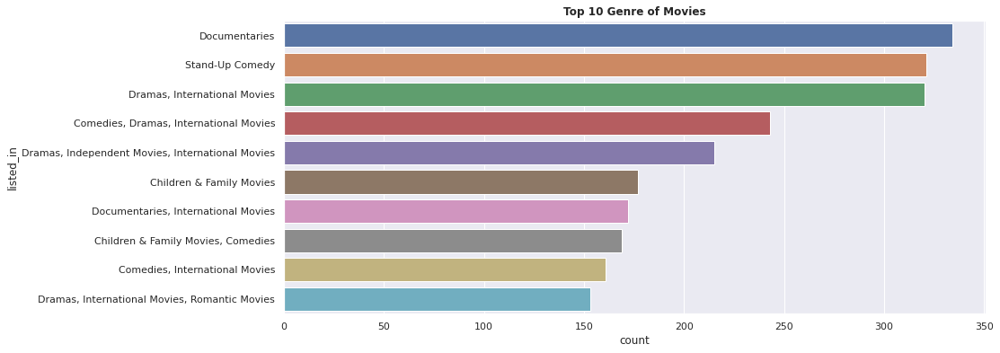

In [ ]:
#Analysing top 10 genre of the movies
plt.figure(figsize=(14,6))
plt.title('Top 10 Genre of Movies',fontweight="bold")
sns.countplot(y=Movies['listed_in'],data=Movies,order=Movies['listed_in'].value_counts().index[0:10])
plt.show()

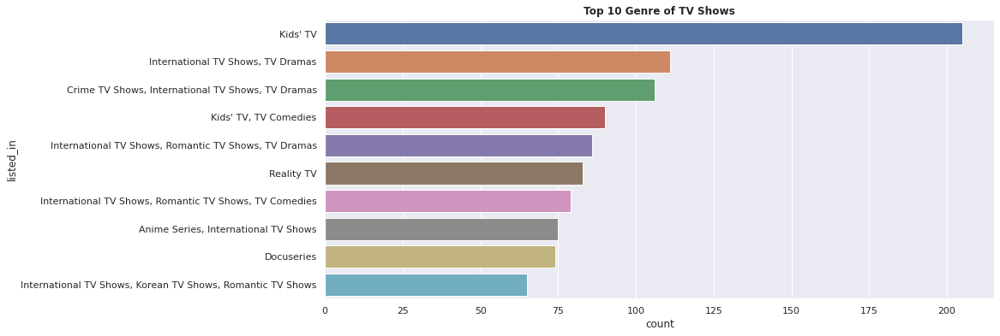

In [ ]:
#Analysing top 10 genre of the movies
plt.figure(figsize=(14,6))
plt.title('Top 10 Genre of TV Shows',fontweight="bold")
sns.countplot(y=TV_Shows['listed_in'],data=TV_Shows,order=TV_Shows['listed_in'].value_counts().index[0:10])
plt.show()

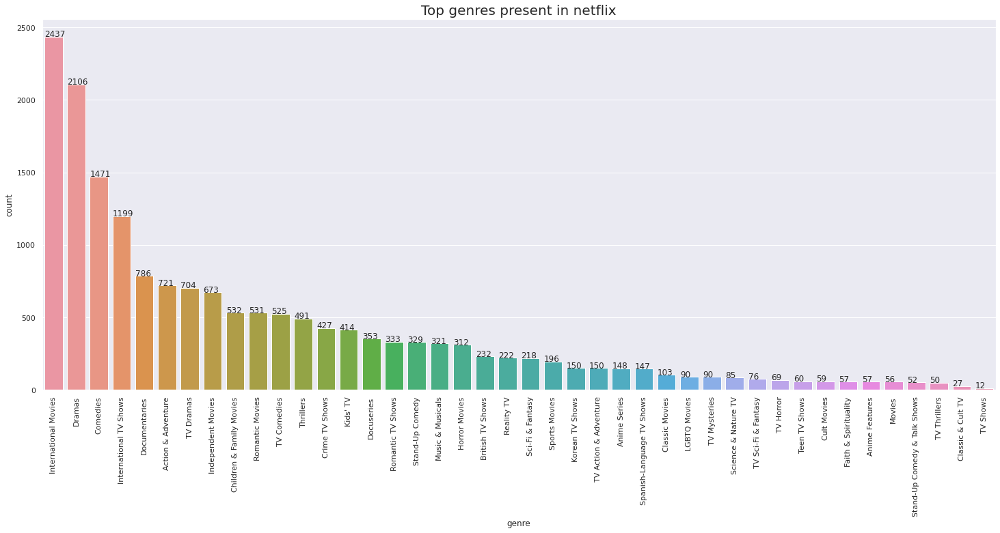

In [ ]:
# visualization code for listed_In(genres)
plt.figure(figsize=(25,10))
graph = sns.barplot(x='genre', y='count', data=genres)
graph.set_title('Top genres present in netflix', size=20)
plt.xticks(rotation=90)

#adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))
plt.show()

Obesrvation :

Highest number of genre are International movies, Dramas, Comedies respectively.

Lowest number of genre are Classic & cult TV, TV Thriller, Stand-Up comedy and Talk show.

#### Descripton Feature

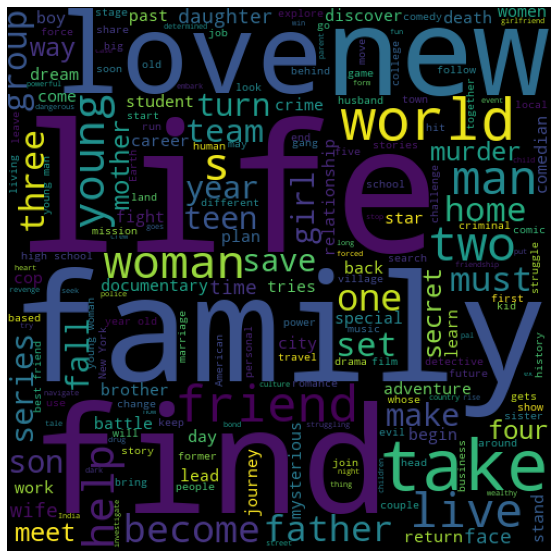

In [ ]:
# Text document visualization code
text = " ".join(word for word in df['description'])

# create the word cloud
wordcloud = WordCloud(stopwords=STOPWORDS).generate(text)

# plot the word cloud
def plot_cloud(wordcloud):
    plt.figure(figsize=(10, 10))
    plt.imshow(wordcloud)
    plt.axis("off");
wordcloud = WordCloud(width = 500, height = 500, background_color='black', random_state=10).generate(text)
plot_cloud(wordcloud)

Observation :

Most of the common words present in description column are family, find, life, love, new, world, take, friend.

#### Time-wise Analysis

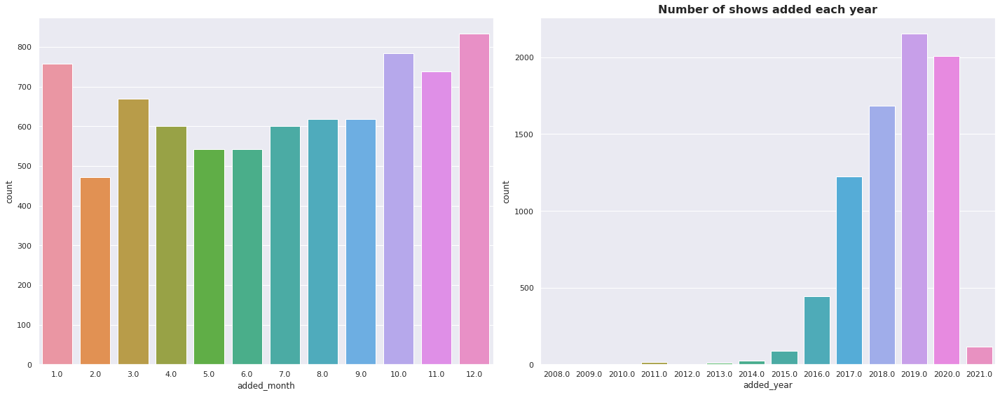

In [ ]:
# Bar plot visualization code
fig,ax = plt.subplots(1,2, figsize=(20,8))

# # Number of shows added each Month
sns.set(rc={'figure.figsize':(15,9)})
sns.countplot(x=df1['added_month'],data=df1, ax=ax[0])
plt.title('Number of shows added each Month',size='16',fontweight="bold")
plt.xlabel('')

# # Number of shows added each year
sns.set(rc={'figure.figsize':(15,9)})
sns.countplot(x=df1['added_year'],data=df1, ax=ax[1])
plt.title('Number of shows added each year',size='16',fontweight="bold")
plt.tight_layout()
plt.show()

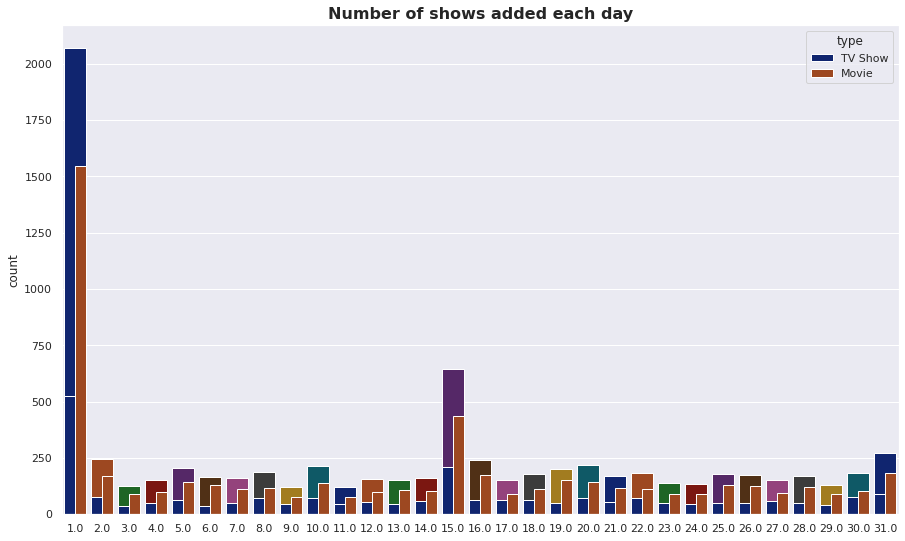

In [ ]:
# Number of shows added each day
sns.countplot(x=df1['added_day'],data=df1,palette="dark")
plt.title('Number of shows added each day',size='16',fontweight="bold")

# Number of shows added each day
sns.countplot(x=df1['added_day'],data=df1,hue='type',palette="dark")
plt.title('Number of shows added each day',size='16',fontweight="bold")
plt.xlabel('')
plt.show()

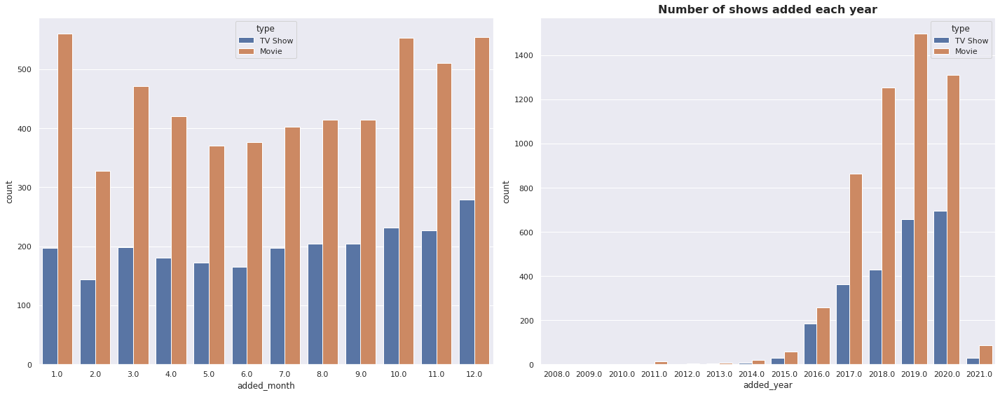

In [ ]:
# Bar plot visualization code
fig,ax = plt.subplots(1,2, figsize=(20,8))

# # Number of shows added each Month for TV Shows and Movies
sns.countplot(x=df1['added_month'],data=df1,hue='type', ax=ax[0])
plt.title('Number of shows added each Month',size='16',fontweight="bold")
plt.xlabel('')

# # Number of shows added each Year for TV Shows and Movies
sns.countplot(x=df1['added_year'],data=df1,hue='type', ax=ax[1])
plt.title('Number of shows added each year',size='16',fontweight="bold")
plt.tight_layout()
plt.show()

Observation:

From above, we can see the Number of TV Shows/Movies added each Month and year since 2008 on Netflix.
In 2020 number of Movies decreased.

## ***6. Clusters Implementation***

### **1. K-Means Clustering**
K-means clustering is an unsupervised machine learning algorithm that is used to divide a dataset into a specified number of clusters. It is called "unsupervised" because the algorithm does not use any labeled examples to learn about the data. Instead, it relies on the inherent structure of the data to group the samples into clusters.

*   Visualizing the **Elbow curve** and **Silhouette score** to decide on the optimal number of clusters for K-means clustering algorithm.

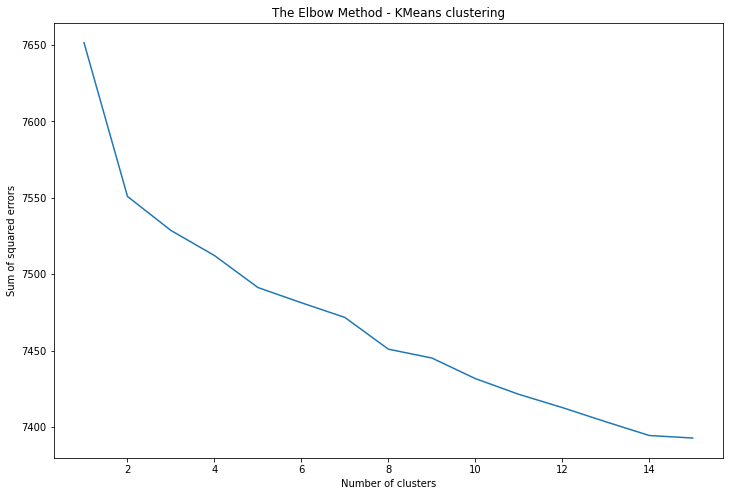

In [ ]:
'''Elbow method to find the optimal value of k'''
# Initialize a list to store the sum of squared errors for each value of k
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

*   The sum of squared distance between each point and the centroid in a cluster decreases with the increase in the number of clusters.

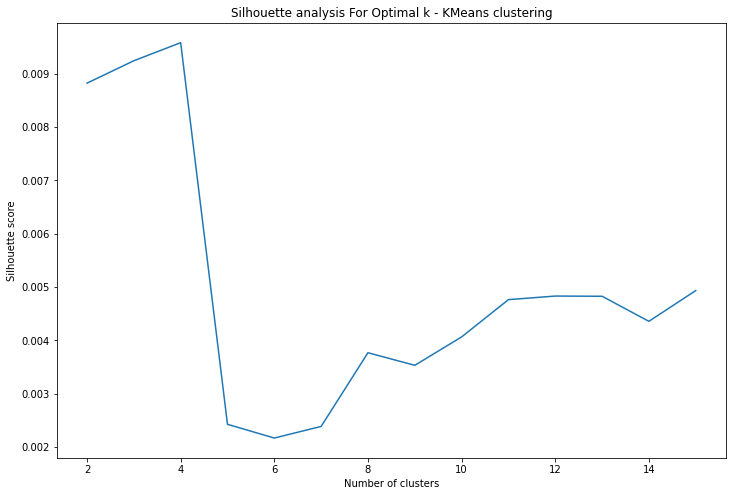

In [ ]:
'''Silhouette score method to find the optimal value of k'''
# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()


*   The highest Silhouette score is obtained for 4 clusters.

In [ ]:
# silhouette_score
# Generating the sample data from make_blobs
# This particular setting has one distinct cluster and 3 clusters placed close
# together.
range_n_clusters = [i for i in range(2,10)]
silhouette_score_ = []
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

For n_clusters = 2 The average silhouette_score is : 0.008825808318708883
For n_clusters = 3 The average silhouette_score is : 0.00928736236115365
For n_clusters = 4 The average silhouette_score is : 0.009516417277098253
For n_clusters = 5 The average silhouette_score is : 0.00534655517025326
For n_clusters = 6 The average silhouette_score is : 0.0028864694700805856
For n_clusters = 7 The average silhouette_score is : 0.0029898378811695193
For n_clusters = 8 The average silhouette_score is : 0.0027659129940472435
For n_clusters = 9 The average silhouette_score is : 0.0036530985456473424


*   The highest Silhouette score is obtained for 4 clusters.



#### Building 4 clusters using the k-means clustering algorithm:

In [ ]:
# Clustering the data into 4 clusters
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=10)
kmeans.fit(X)

KMeans(n_clusters=4, random_state=10)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(7512.146439313057, 0.009516417277098253)


In [ ]:
#predict the labels of clusters.
label = kmeans.fit_predict(X)

In [ ]:
# Adding a kmeans cluster number attribute
df['kmeans_cluster'] = kmeans.labels_

In [ ]:
df.sample(5)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,director,cast,country,rating,listed_in,description,kmeans_cluster
1288,Movie,Chasing Amy,Kevin Smith,"Ben Affleck, Joey Lauren Adams, Jason Lee, Dwi...",United States,R,"Comedies, Cult Movies, Dramas",Comic book artist Holden meets the perfect wom...,1
1535,TV Show,Crime Diaries: The Candidate,,"Jorge A. Jiménez, Ilse Salas, Alberto Guerra, ...",Mexico,TV-MA,"Crime TV Shows, International TV Shows, Spanis...","In 1994, Mexican presidential candidate Luis D...",3
3526,Movie,Lalbaug Parel: Zali Mumbai Sonyachi,Mahesh Manjrekar,"Sachin Khedekar, Seema Biswas, Ankush Chaudhar...",India,TV-MA,"Dramas, International Movies",Industrial workers struggle against the greed ...,0
6687,Movie,The Most Hated Woman in America,Tommy O'Haver,"Melissa Leo, Josh Lucas, Vincent Kartheiser, J...",United States,TV-MA,Dramas,This drama follows the controversial life of o...,1
3749,Movie,Love Beats Rhymes,RZA,"Azealia Banks, Lucien Laviscount, Jill Scott, ...",United States,R,"Dramas, Romantic Movies","After enrolling in a college poetry course, a ...",1


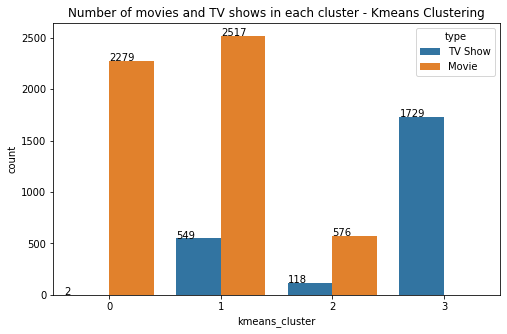

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=df, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))
plt.show()


*   Successfully built 4 clusters using the k-means clustering algorithm.



#### Wordclouds for different clusters

In [ ]:
# Building wordclouds for different clusters in K-Means Clustering
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = df[['kmeans_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS),width = 500, height = 500, background_color='black', random_state=10).generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.show()

In [ ]:
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description',
       'Texts', 'kmeans_cluster'],
      dtype='object')

cluster 0


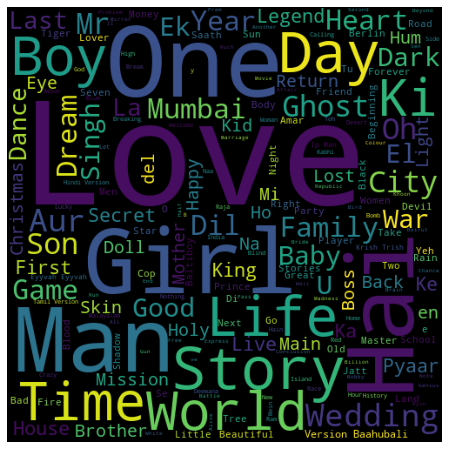

cluster 1


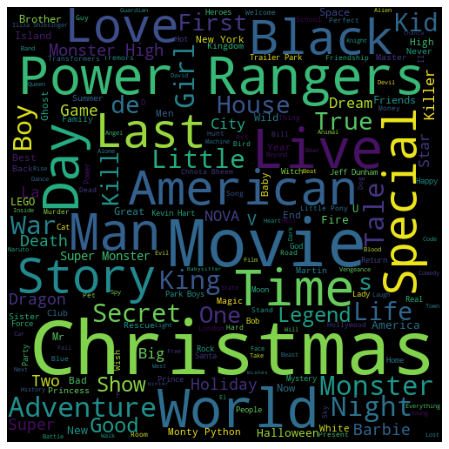

cluster 2


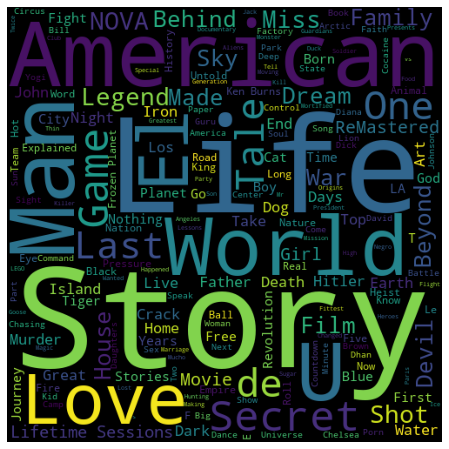

cluster 3


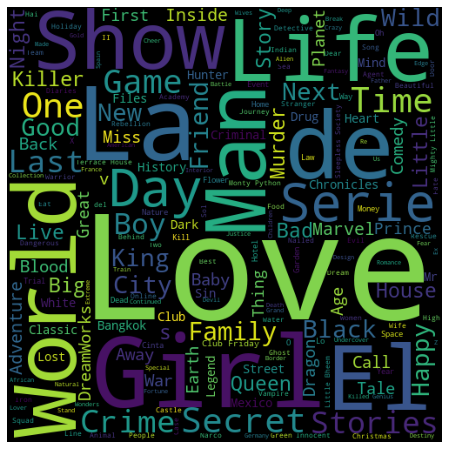

In [ ]:
# Word Cloud on "title" column for different cluster
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

cluster 0


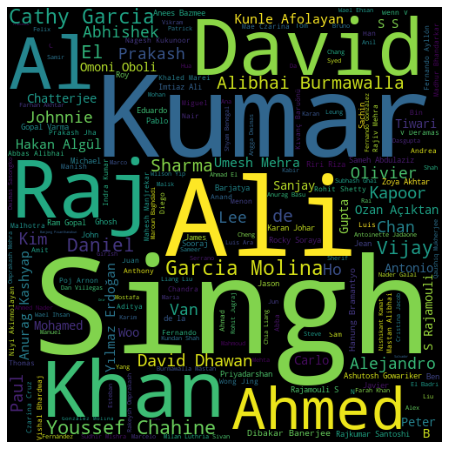

cluster 1


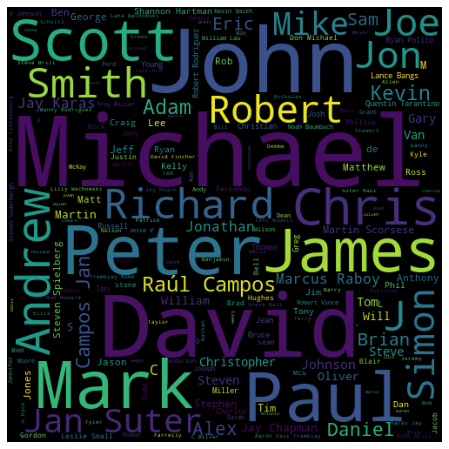

cluster 2


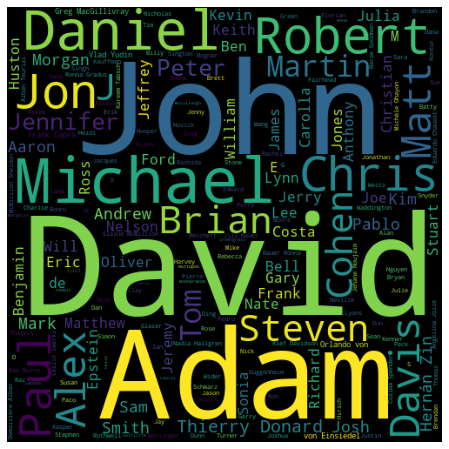

cluster 3


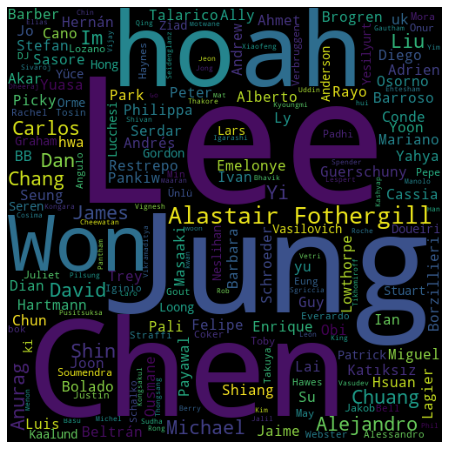

In [ ]:
# Word Cloud on "director" column for different cluster
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'director')

cluster 0


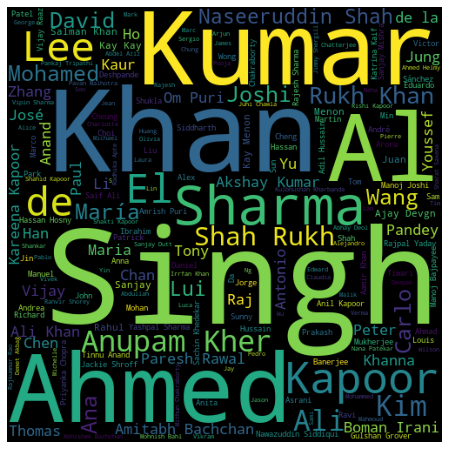

cluster 1


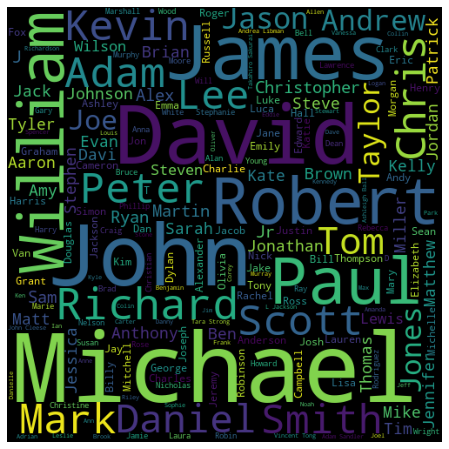

cluster 2


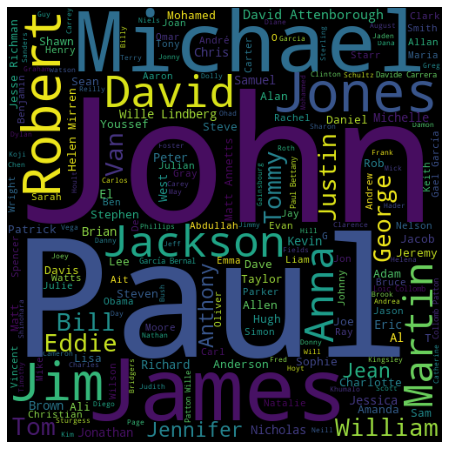

cluster 3


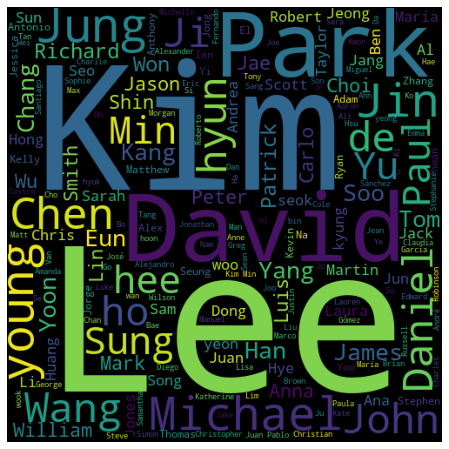

In [ ]:
# Word Cloud on "cast" column for different cluster
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

cluster 0


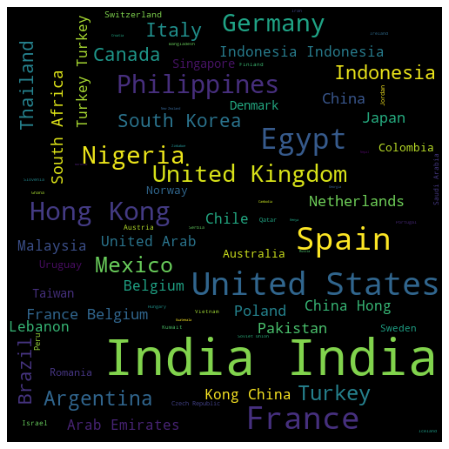

cluster 1


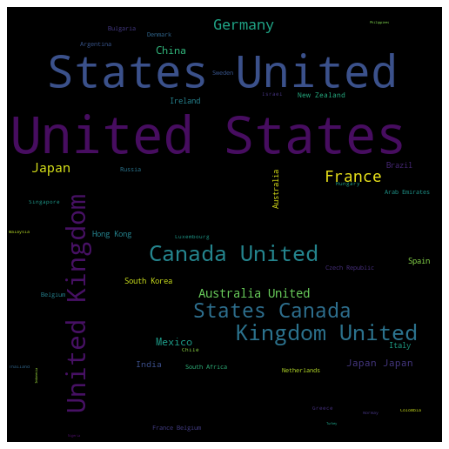

cluster 2


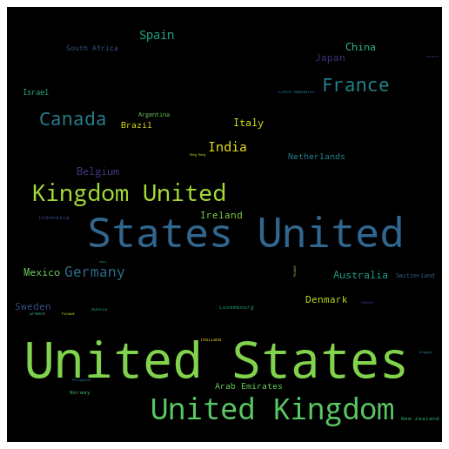

cluster 3


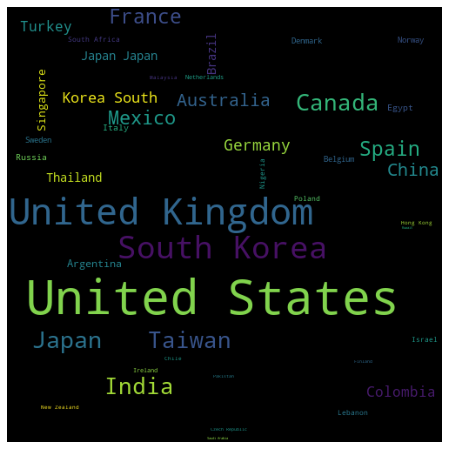

In [ ]:
# Word Cloud on "country" column column for different cluster
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

cluster 0


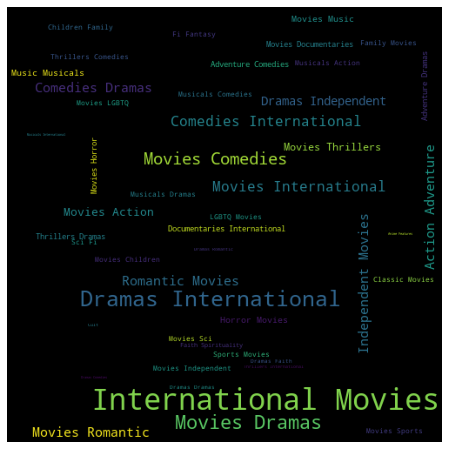

cluster 1


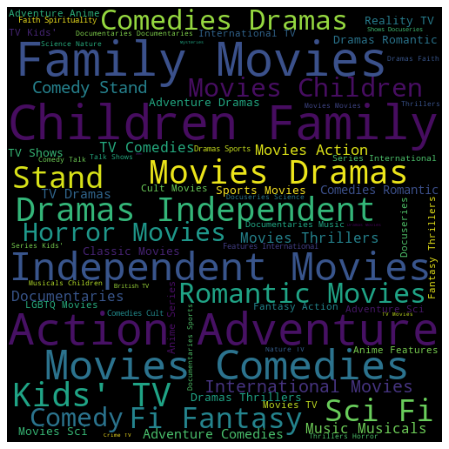

cluster 2


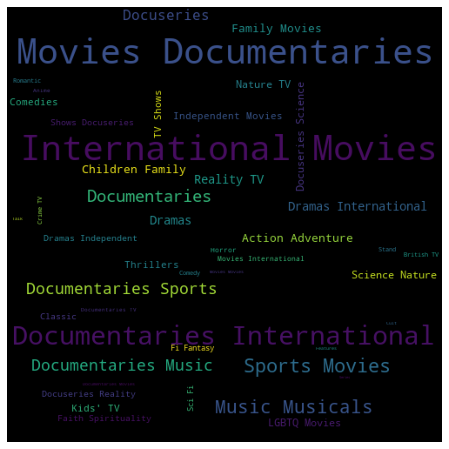

cluster 3


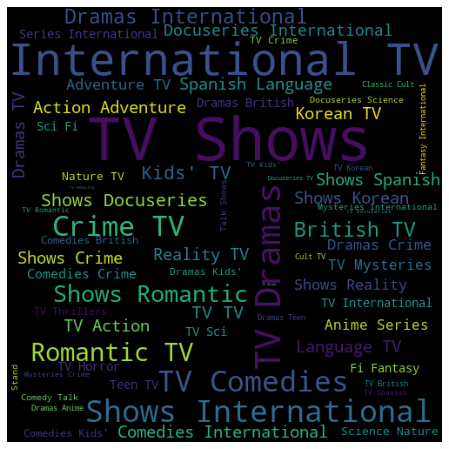

In [ ]:
# Word Cloud on "listed_in"(genre) column for different cluster
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

cluster 0


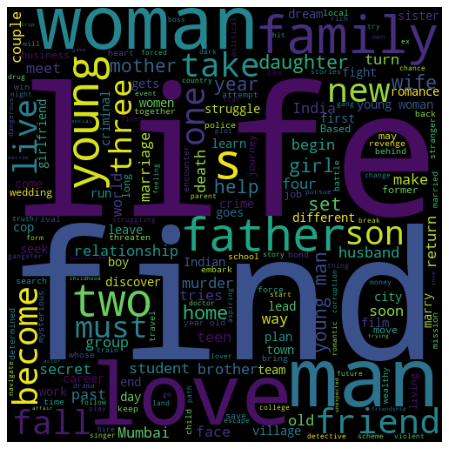

cluster 1


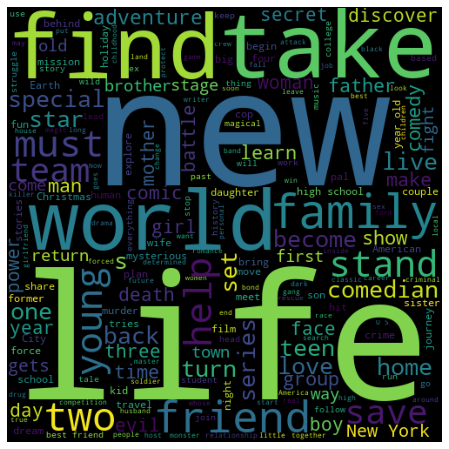

cluster 2


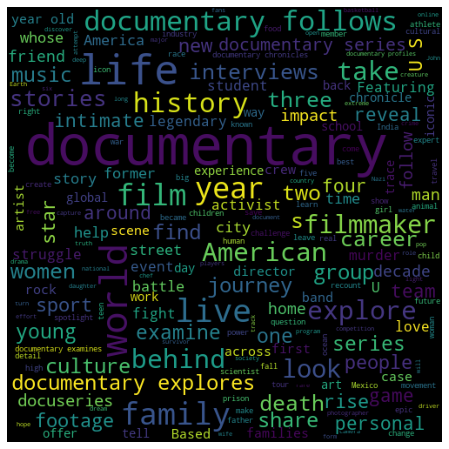

cluster 3


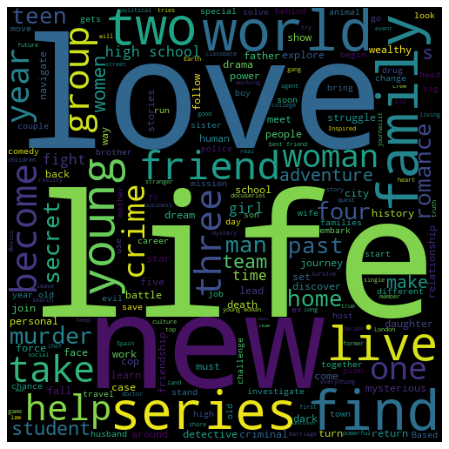

In [ ]:
# Word Cloud on "description" column for different cluster
for i in range(4):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

### **2. Hierarchical clustering**
Building clusters using the Agglomerative (hierarchical) clustering algorithm.

Agglomerative hierarchical clustering is a method of clustering that is used to build a hierarchy of clusters. It is a bottom-up approach, where each sample is initially treated as a single-sample cluster and clusters are merged together as they are deemed similar.

The resulting clusters form a tree-like structure called a dendrogram, which shows the relationships between the clusters at each level of the hierarchy.

Visualizing the dendrogram to decide on the optimal number of clusters for the agglomerative (hierarchical) clustering algorithm:

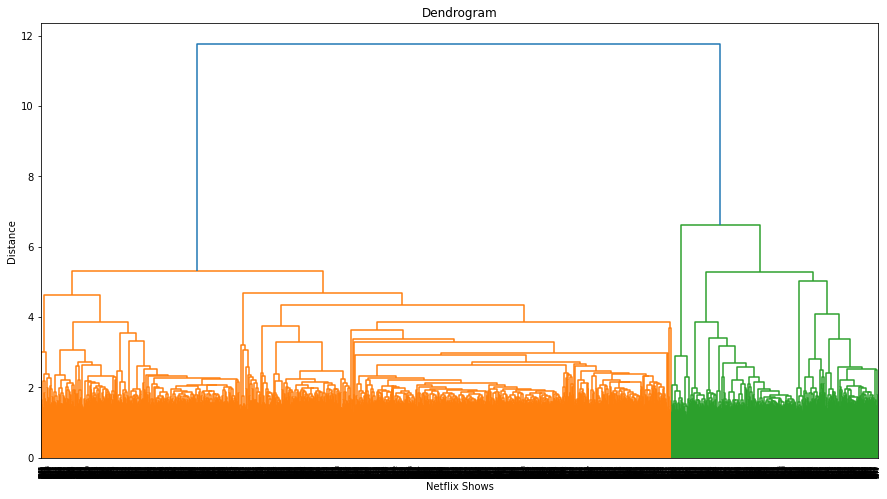

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(15, 8))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.show()

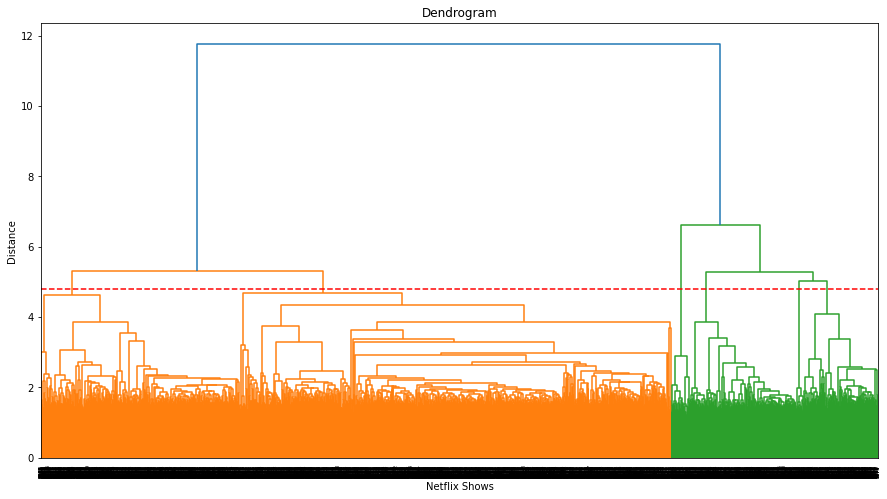

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(15, 8))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4.8, color='r', linestyle='--')
plt.show()

At a distance of 4.8 units, 6 clusters can be built using the agglomerative clustering algorithm.

#### Building 6 clusters using the Agglomerative clustering algorithm:

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(X)

array([4, 0, 0, ..., 0, 3, 0])

In [ ]:
# Adding a hierarchical cluster number attribute
df['hierarchical_cluster'] = hierarchical.labels_

In [ ]:
df.sample(2)[['type', 'title', 'director', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,director,cast,country,rating,listed_in,description,hierarchical_cluster
5704,Movie,Someone Great,Jennifer Kaytin Robinson,"Gina Rodriguez, Brittany Snow, DeWanda Wise, L...",United States,R,"Comedies, Romantic Movies","On the heels of a blindsiding breakup, music j...",0
307,Movie,ADAM SANDLER 100% FRESH,Steve Brill,Adam Sandler,United States,TV-MA,Stand-Up Comedy,"From ""Heroes"" to ""Ice Cream Ladies"" – Adam San...",0


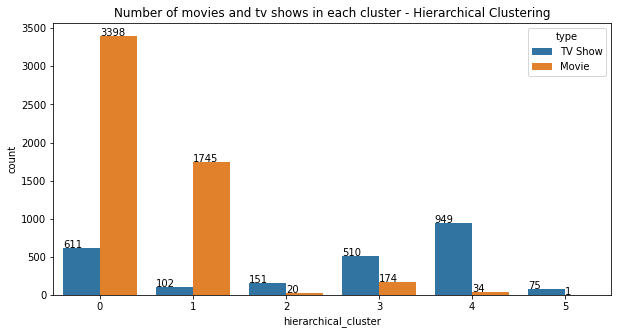

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=df, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

*   Successfully built 6 clusters using the Agglomerative (hierarchical) clustering algorithm.



### Topic Modeling

#### Building wordclouds for different clusters using hierarchical Clustering

In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = df[['hierarchical_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS),width = 500, height = 500, background_color='black', random_state=10).generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

cluster 0


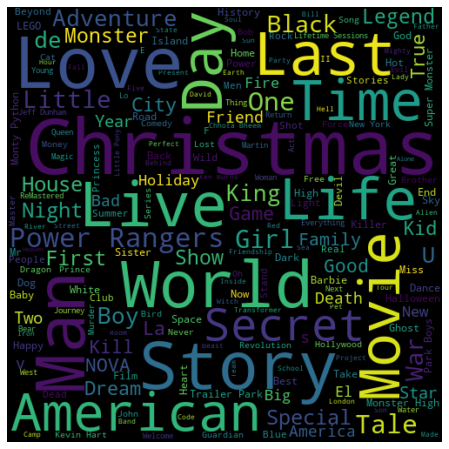

cluster 1


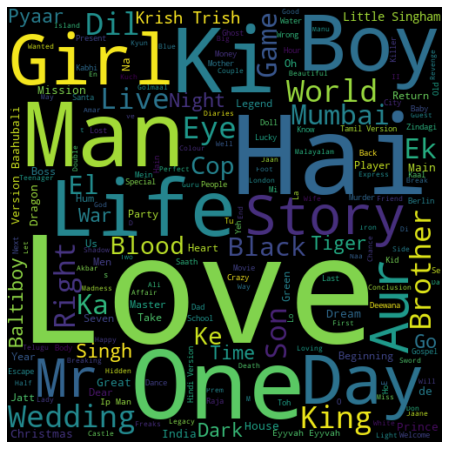

cluster 2


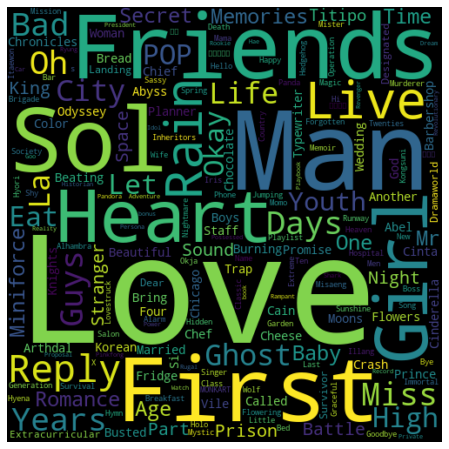

cluster 3


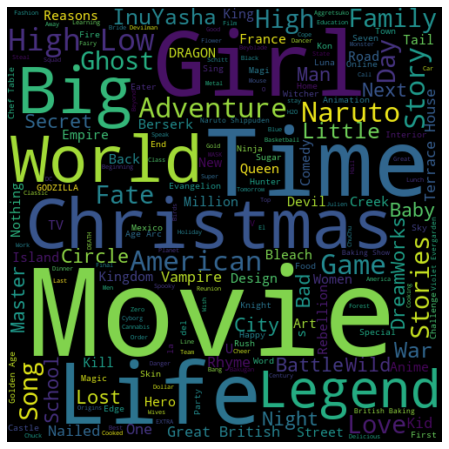

cluster 4


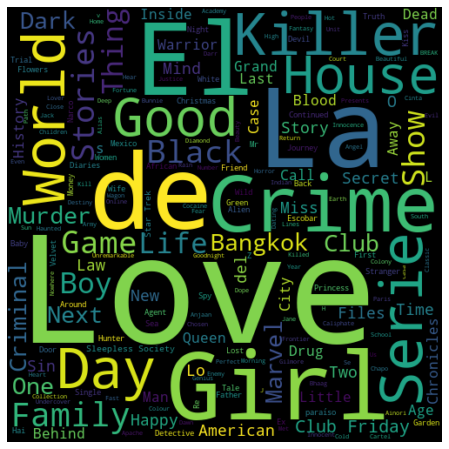

cluster 5


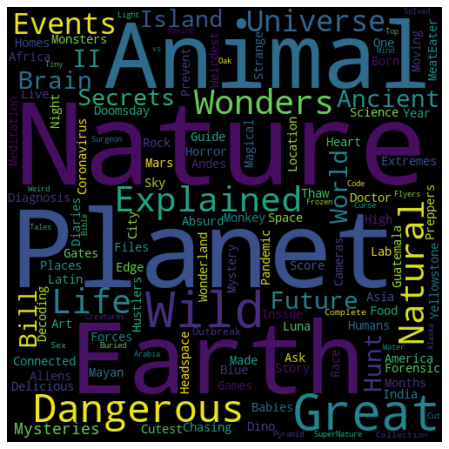

In [ ]:
# Word Cloud on "title" column for different cluster
for i in range(6):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

cluster 0


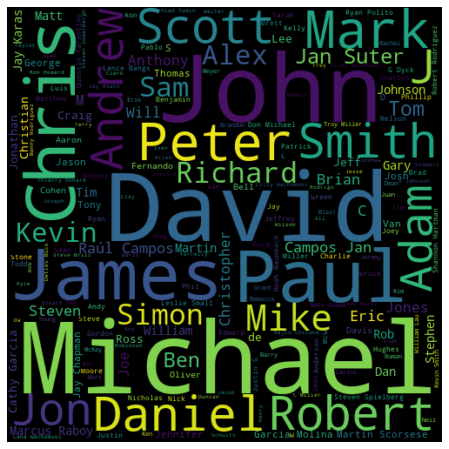

cluster 1


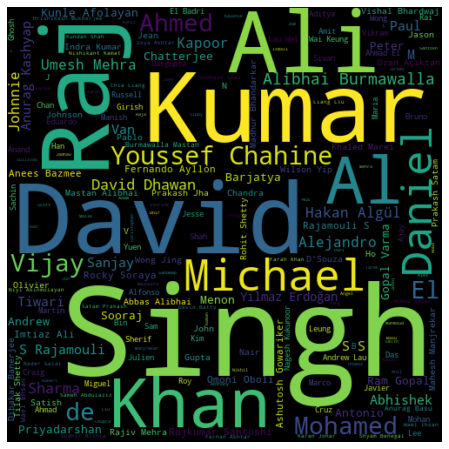

cluster 2


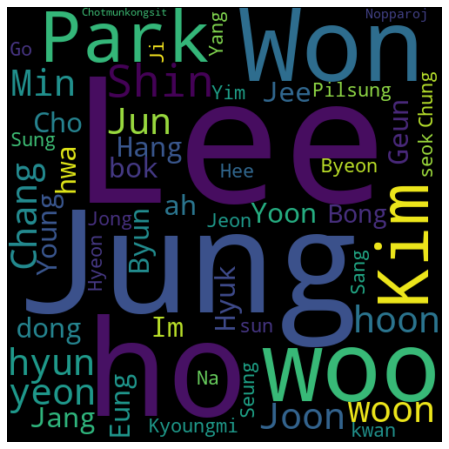

cluster 3


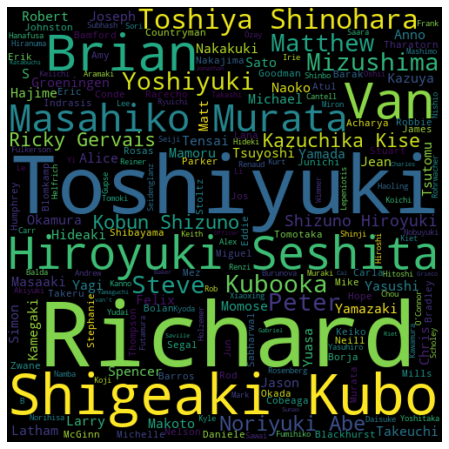

cluster 4


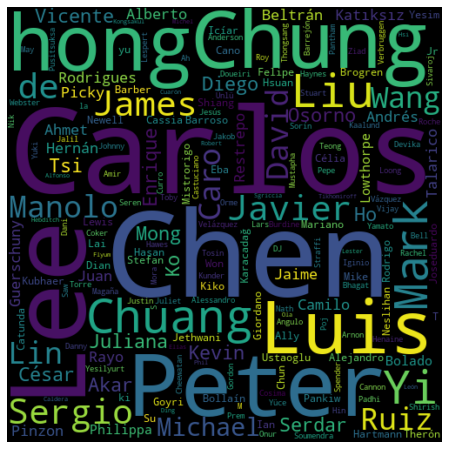

cluster 5


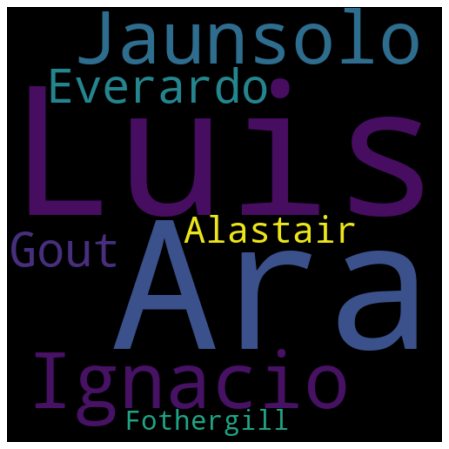

In [ ]:
# Word Cloud on "director" column for different cluster
for i in range(6):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'director')

cluster 0


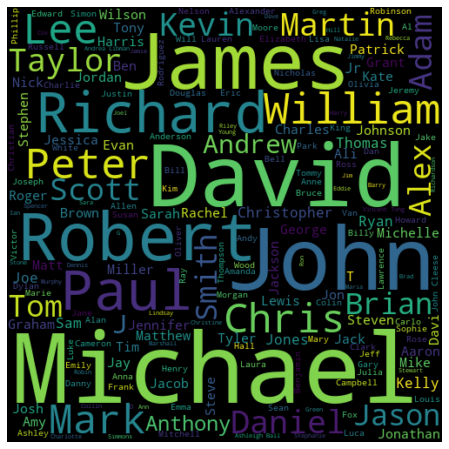

cluster 1


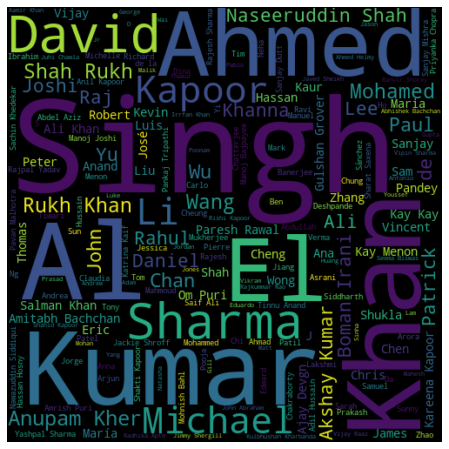

cluster 2


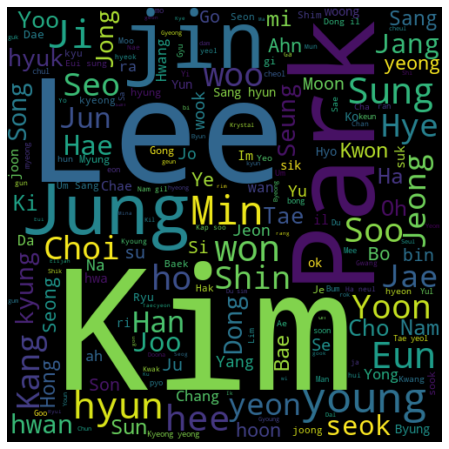

cluster 3


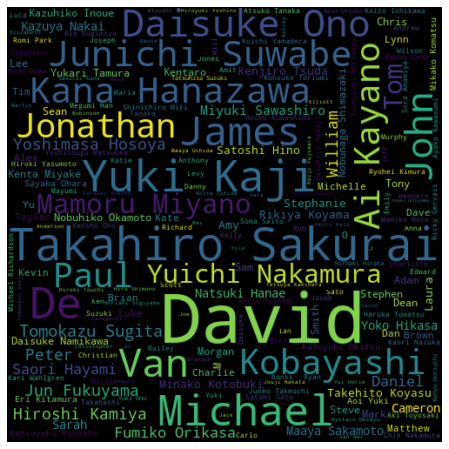

cluster 4


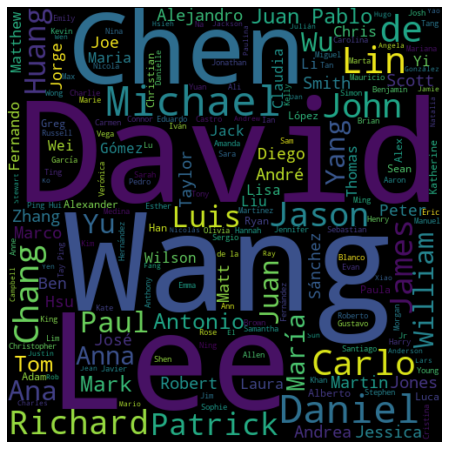

cluster 5


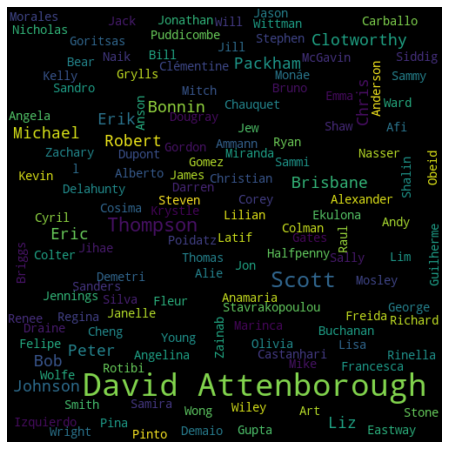

In [ ]:
# Word Cloud on "cast" column for different cluster
for i in range(6):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

cluster 0


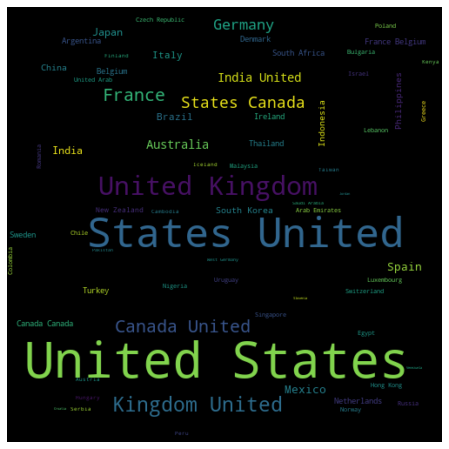

cluster 1


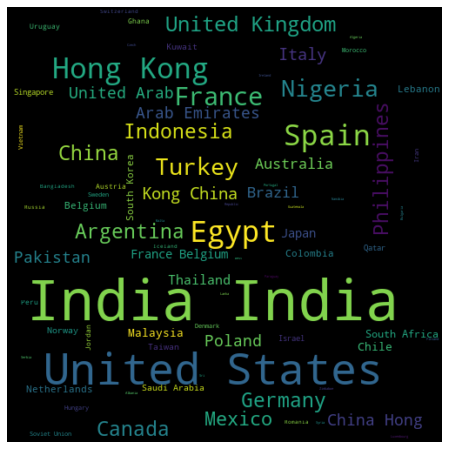

cluster 2


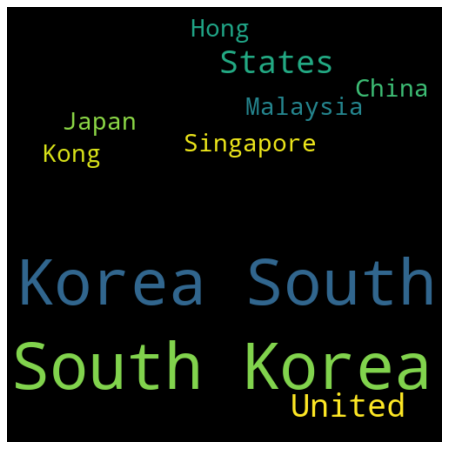

cluster 3


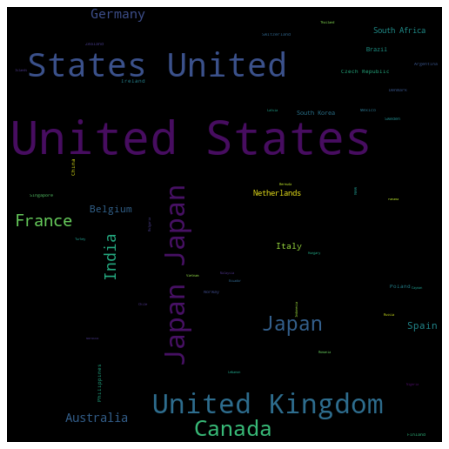

cluster 4


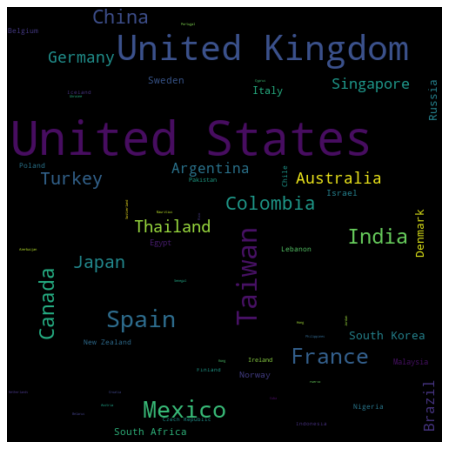

cluster 5


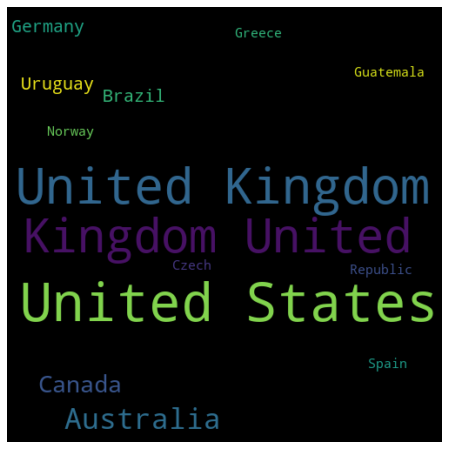

In [ ]:
# Word Cloud on "country" column column for different cluster
for i in range(6):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

cluster 0


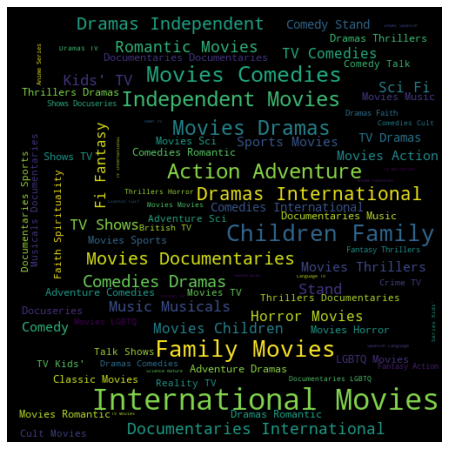

cluster 1


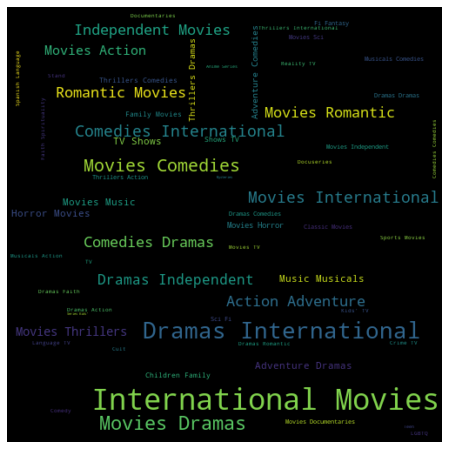

cluster 2


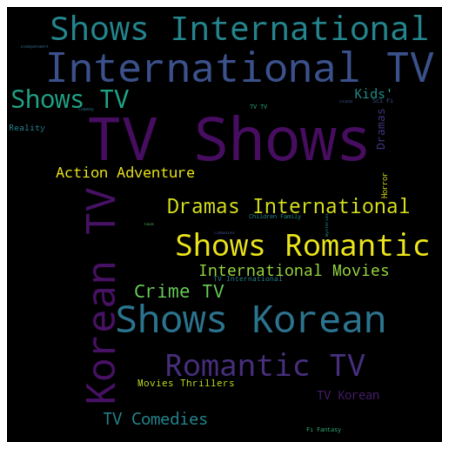

cluster 3


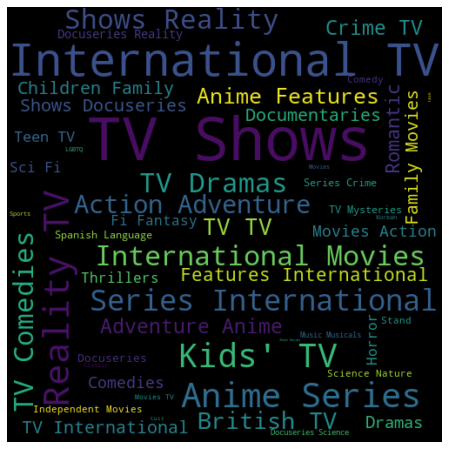

cluster 4


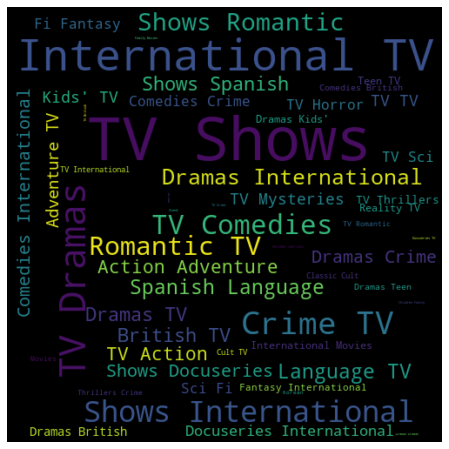

cluster 5


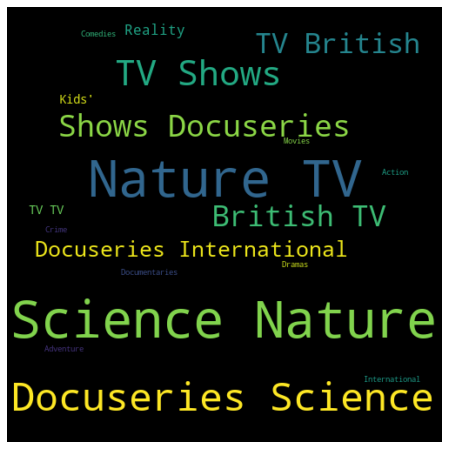

In [ ]:
# Word Cloud on "listed_in"(genre) column for different cluster
for i in range(6):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

cluster 0


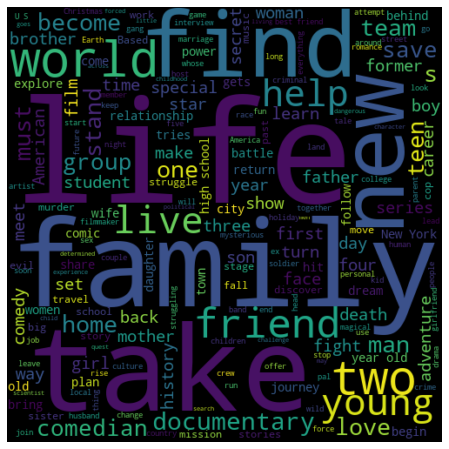

cluster 1


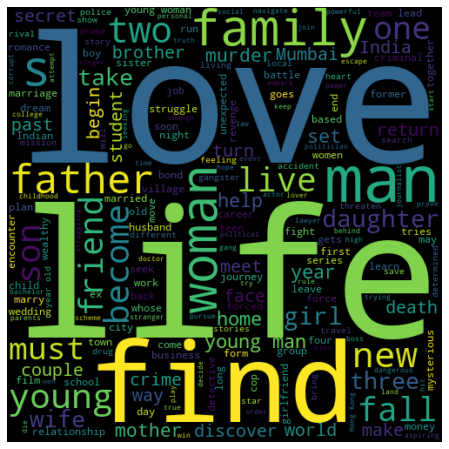

cluster 2


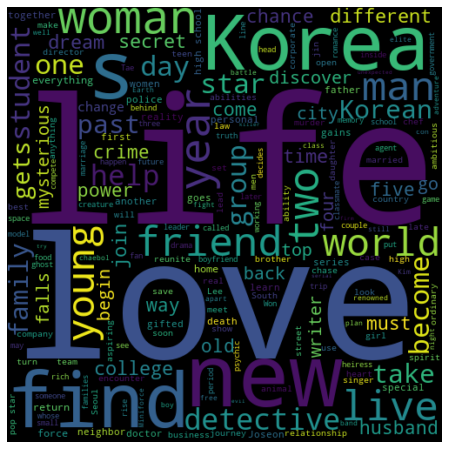

cluster 3


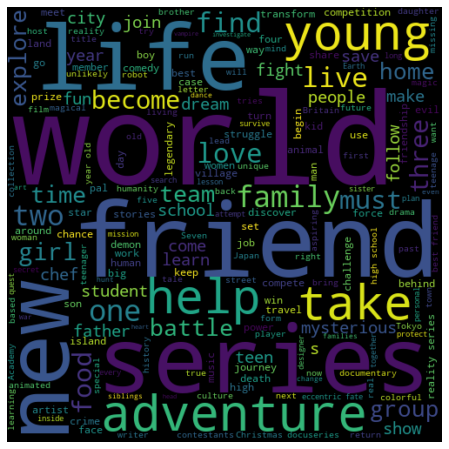

cluster 4


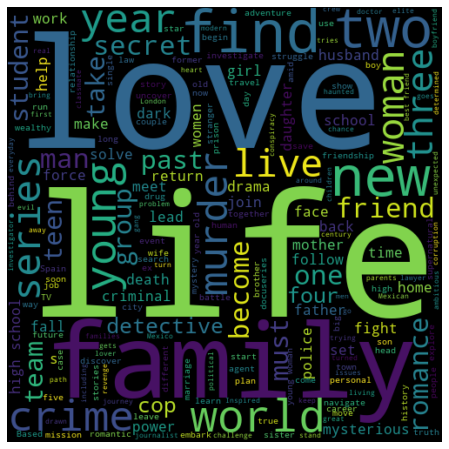

cluster 5


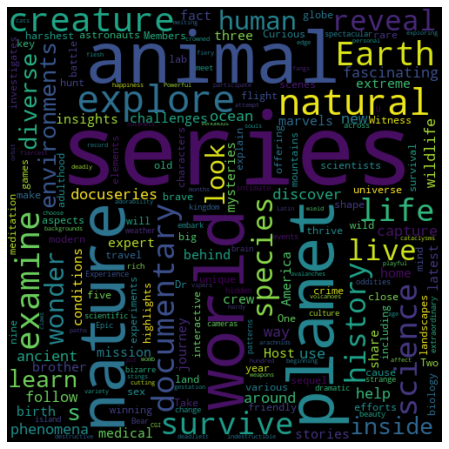

In [ ]:
# Word Cloud on "description" column for different cluster
for i in range(6):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

# **8. Conclusion**

In this project, we worked on a text clustering problem where we had to classify/group the Netflix shows into certain clusters such that the shows within a cluster are
similar to each other and the shows in different clusters are dissimilar to each other.


*   The data contained about 7787 records, and 11 attributes.
We began by dealing with the dataset's missing values and doing exploratory data analysis (EDA).
*   It was found that Netflix hosts more movies than TV shows on its platform, and the total number of shows added on Netflix is growing exponentially. Also, majority of
the shows were produced in the United States.
*   It was decided to cluster the data based on the attributes: director, cast, country, genre, ,title, rating and description. The values in these attributes were tokenized,
preprocessed, and then vectorized using TFIDF vectorizer.
*   Through TFIDF Vectorization, we created a total of 5000 attributes.
*   We used (PCA) Principal Component Analysis  to handle the curse of dimensionality. 4000 components were able to capture more than 90% of variance, and
hence, the number of components were restricted to 4000.
*   We first built clusters using the K-Means Clustering algorithm, and the optimal number of clusters came out to be 4. This was obtained through the elbow method
and Silhouette score analysis.
*   Then clusters were built using the Agglomerative clustering algorithm, and the optimal number of clusters came out to be 6. This was obtained after visualizing
the dendrogram.
*   A content based recommender system was built using the similarity matrix obtained after using cosine similarity. This recommender system will make 10
recommendations to the user based on the type of Movie or TV Show they watched.